# Import packages

In [1]:
import json
import numpy as np
import matplotlib.pyplot as plt
from torchvision import datasets, transforms

# Functions

In [38]:
def load_json(p):
    with open(p) as f:
        data = json.load(f)
    return data

def sort_dict_by_nums_of_imgs(d, topk=10):
    items = sorted(
        d.items(), 
        key=lambda x: len(x[1]['img_idxs']), 
        reverse=True
    )
    sorted_d = {key: val for key, val in items[:topk]}
    return sorted_d

def gen_StochasticDepth_151_path(label):
    return f'/raid/NeuEvo/data/important_neuron/convnext_pretrained/data/label={label}/StochasticDepth_151-topk_n=10.json'

def gen_important_neuron_path(model_nickname, layer, label):
    return f'/raid/NeuEvo/data/important_neuron/{model_nickname}/data/label={label}/{layer}-topk_n=10.json'

def gen_stimulus_path(model_nickname):
    return f'/raid/NeuEvo/data/stimulus/{model_nickname}/data/stimulus-topk_s=20.json'

def show_imgs(img_idxs):
    for img_idx in img_idxs:
        img = raw_training_datasets[img_idx][0]
        img = np.einsum('kij->ijk', img)
        plt.title(f'img: {img_idx}')
        plt.imshow(img)
        plt.show()
        
def print_important_neurons(model_nickname, layer, label):
    p = gen_important_neuron_path(model_nickname, layer, label)
    d = load_json(p)
    sorted_d = sort_dict_by_nums_of_imgs(d)

    for neuron in sorted_d.keys():
        num_imgs = len(d[neuron]['img_idxs'])
        print(f'{neuron}, {num_imgs}')
        
def show_stimulus_of_important_neurons(model_nickname, layer, label):
    # Important neurons
    p = gen_important_neuron_path(model_nickname, layer, label)
    d = load_json(p)
    sorted_d = sort_dict_by_nums_of_imgs(d)
        
    # Stimulus of the important neurons
    p = gen_stimulus_path(model_nickname)
    stimulus = load_json(p)

    # Show the stimulus
    nrows = 2
    ncols = 5

    for neuron in sorted_d.keys():
        neuron_i = int(neuron.split('-')[-1])
        stimulating_imgs = stimulus[layer][neuron_i]
        fig, ax = plt.subplots(
            nrows, ncols, 
            figsize=(nrows * 4, ncols * 0.6)
        )
        fig.tight_layout()
        num_imgs = len(d[neuron]['img_idxs'])
        plt.title(f'{neuron}, {num_imgs}', loc='left')
        for i, img_idx in enumerate(stimulating_imgs[:nrows * ncols]):
            img = raw_training_datasets[img_idx][0]
            img = np.einsum('kij->ijk', img)

            row = int(i / ncols)
            col = i - row * ncols
            ax[row, col].imshow(img)
            # plt.subplot(nrows, ncols, i + 1)

            # plt.imshow(img)
        num_imgs = len(d[neuron]['img_idxs'])
        plt.show()

In [3]:
raw_data_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

raw_training_datasets = datasets.ImageFolder(
    '../../../../ILSVRC2012/train',
    raw_data_transform
)

# Labels

In [4]:
labels = {
    230: 'Shetland_sheepdog', 
    384: 'Indri',
    400: 'academic_gown', 
    457: 'bow_tie',
    555: 'fire_engine'
}

# VGG16-207

## Conv2d_0

Label=230, Shetland_sheepdog
Sequential_0_Conv2d_0-32, 1300
Sequential_0_Conv2d_0-51, 1292
Sequential_0_Conv2d_0-5, 1251
Sequential_0_Conv2d_0-26, 1139
Sequential_0_Conv2d_0-36, 857
Sequential_0_Conv2d_0-0, 821
Sequential_0_Conv2d_0-40, 722
Sequential_0_Conv2d_0-50, 649
Sequential_0_Conv2d_0-16, 623
Sequential_0_Conv2d_0-33, 567


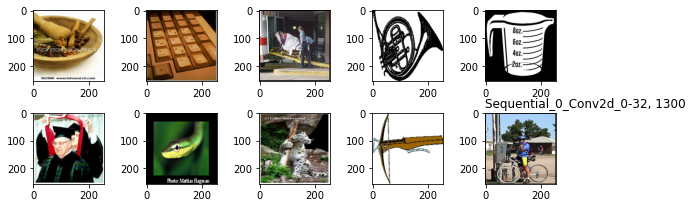

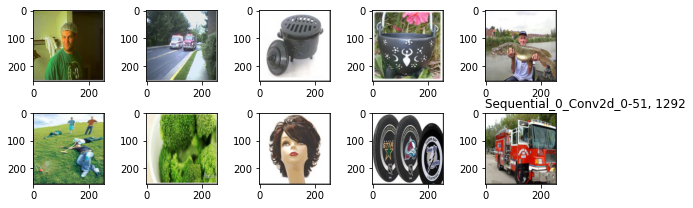

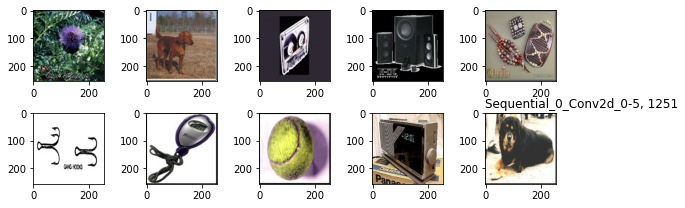

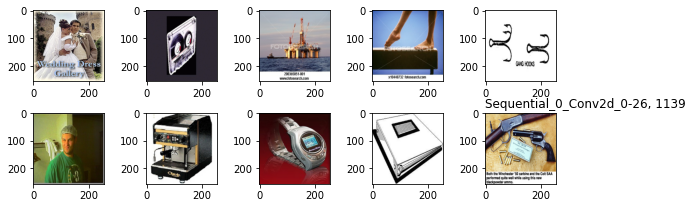

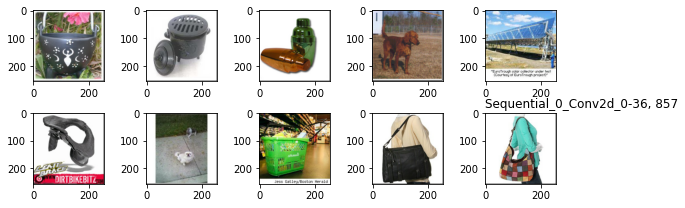

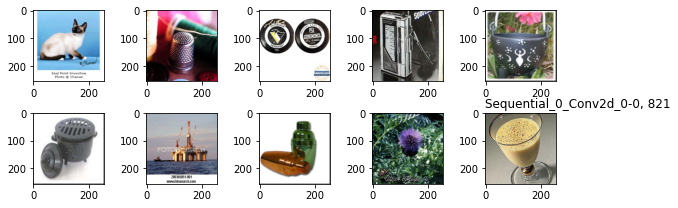

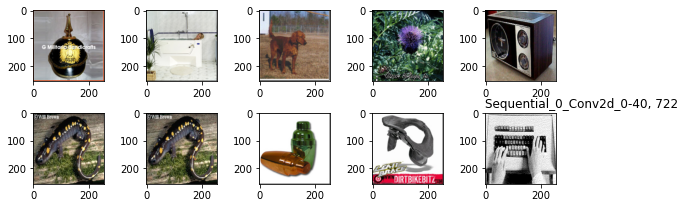

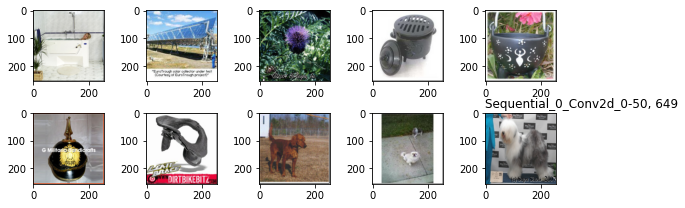

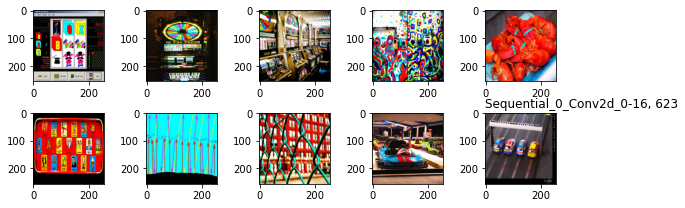

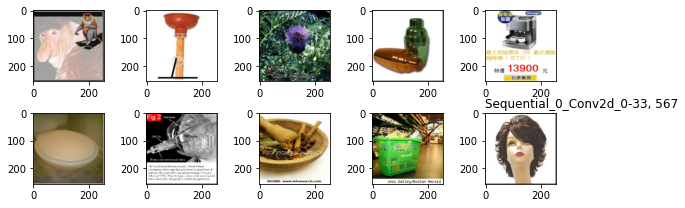

In [39]:
label = 230
layer = "Sequential_0_Conv2d_0"
model_nickname = 'vgg16-0.01-207'

print(f'Label={label}, {labels[label]}')

print_important_neurons(model_nickname, layer, label)
show_stimulus_of_important_neurons(model_nickname, layer, label)

Label=457, bow_tie
Sequential_0_Conv2d_0-32, 1013
Sequential_0_Conv2d_0-51, 1008
Sequential_0_Conv2d_0-5, 985
Sequential_0_Conv2d_0-26, 885
Sequential_0_Conv2d_0-36, 743
Sequential_0_Conv2d_0-0, 682
Sequential_0_Conv2d_0-40, 548
Sequential_0_Conv2d_0-16, 519
Sequential_0_Conv2d_0-50, 503
Sequential_0_Conv2d_0-49, 473


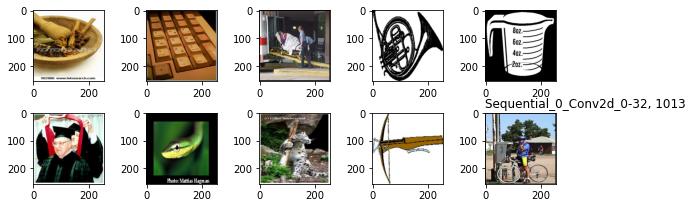

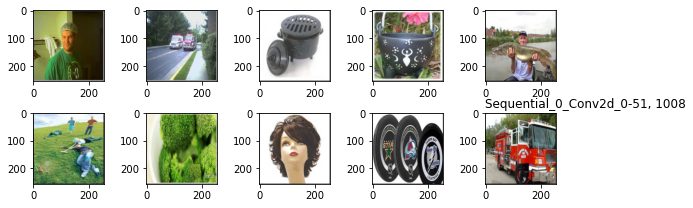

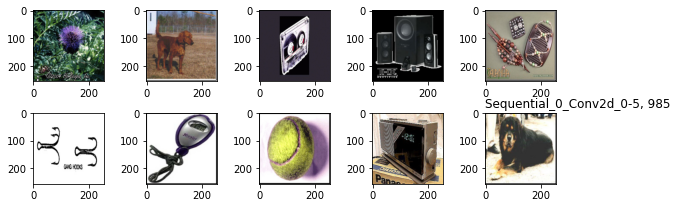

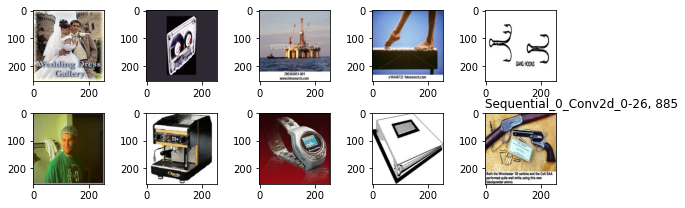

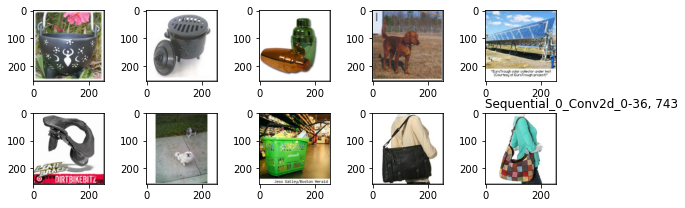

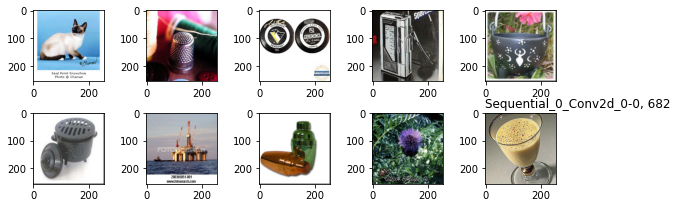

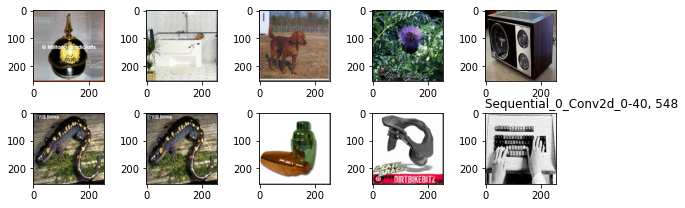

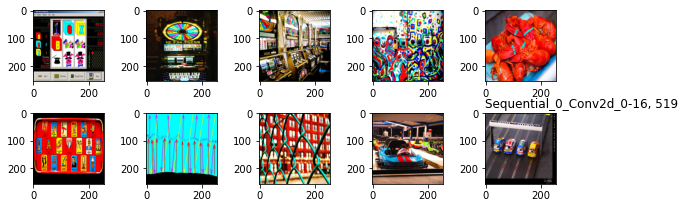

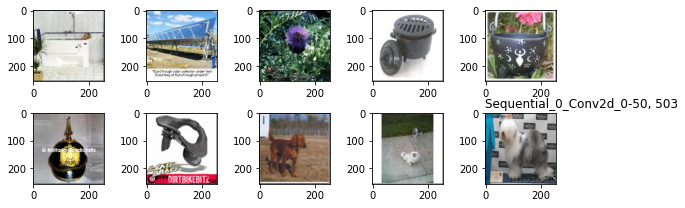

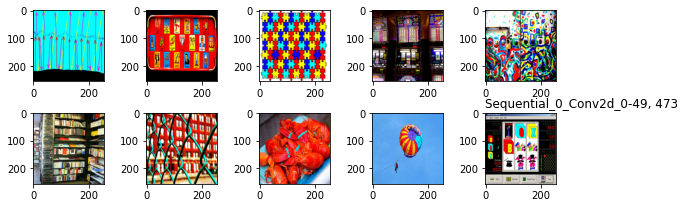

In [40]:
label = 457
layer = "Sequential_0_Conv2d_0"
model_nickname = 'vgg16-0.01-207'

print(f'Label={label}, {labels[label]}')

print_important_neurons(model_nickname, layer, label)
show_stimulus_of_important_neurons(model_nickname, layer, label)

## Conv2d_28

Label=230, Shetland_sheepdog
Sequential_0_Conv2d_28-171, 803
Sequential_0_Conv2d_28-188, 763
Sequential_0_Conv2d_28-371, 763
Sequential_0_Conv2d_28-68, 621
Sequential_0_Conv2d_28-378, 545
Sequential_0_Conv2d_28-323, 429
Sequential_0_Conv2d_28-444, 400
Sequential_0_Conv2d_28-223, 379
Sequential_0_Conv2d_28-193, 356
Sequential_0_Conv2d_28-62, 295


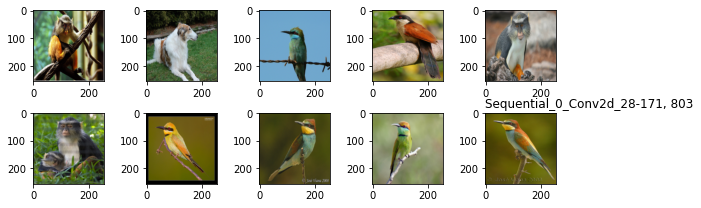

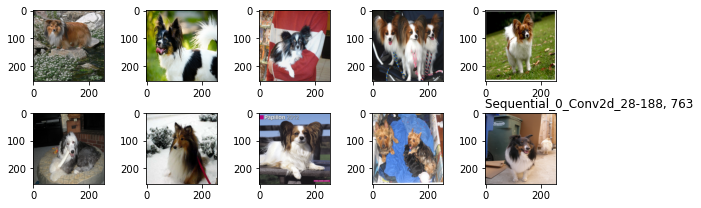

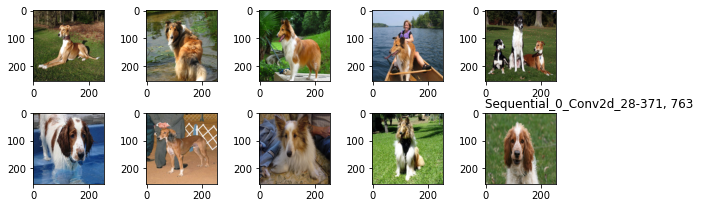

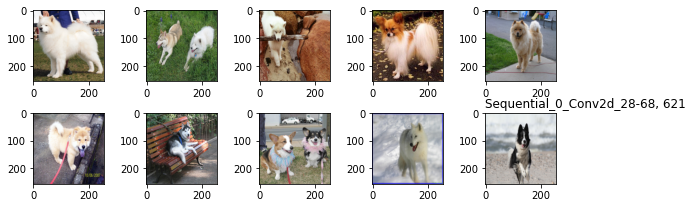

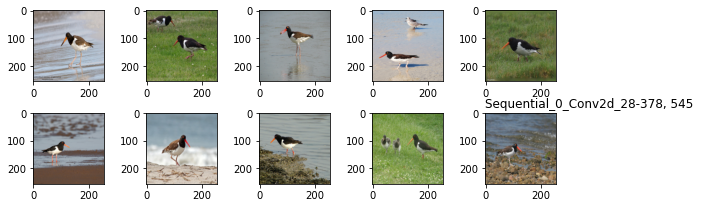

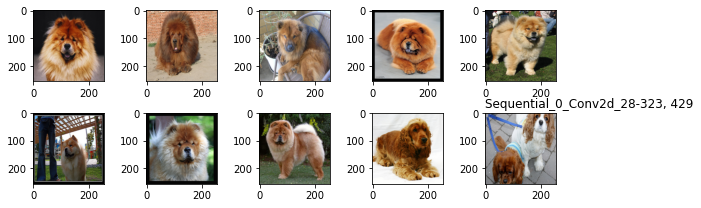

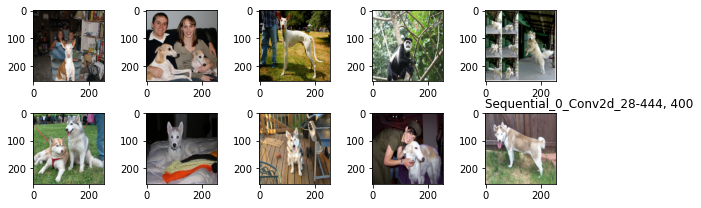

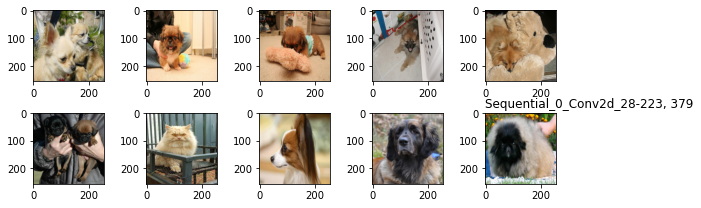

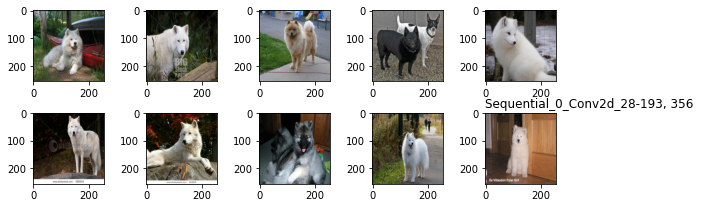

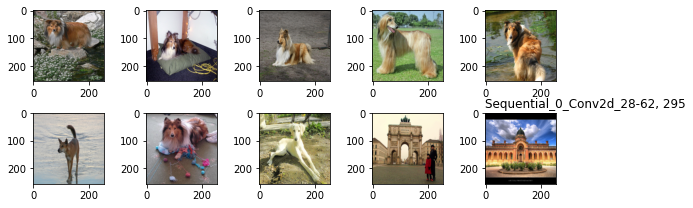

In [42]:
label = 230
layer = "Sequential_0_Conv2d_28"
model_nickname = 'vgg16-0.01-207'

print(f'Label={label}, {labels[label]}')

print_important_neurons(model_nickname, layer, label)
show_stimulus_of_important_neurons(model_nickname, layer, label)

Label=384, Indri
Sequential_0_Conv2d_28-314, 606
Sequential_0_Conv2d_28-121, 555
Sequential_0_Conv2d_28-264, 548
Sequential_0_Conv2d_28-337, 414
Sequential_0_Conv2d_28-383, 343
Sequential_0_Conv2d_28-258, 335
Sequential_0_Conv2d_28-230, 328
Sequential_0_Conv2d_28-46, 318
Sequential_0_Conv2d_28-411, 293
Sequential_0_Conv2d_28-478, 285


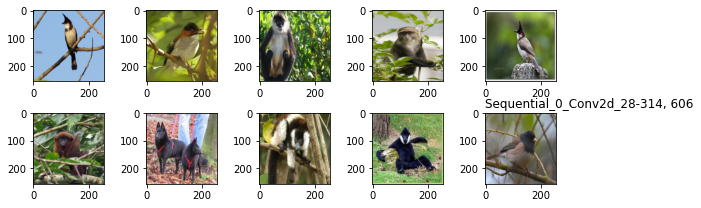

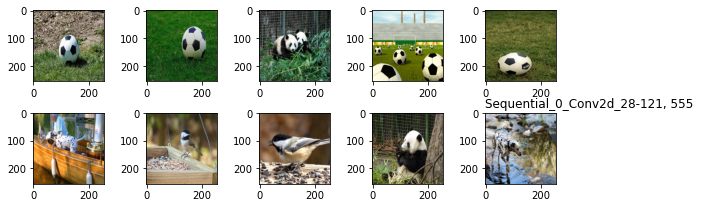

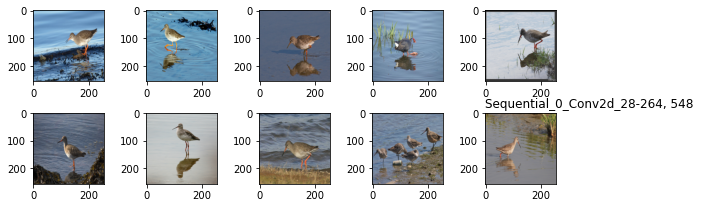

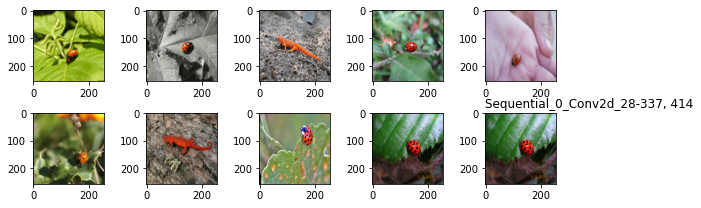

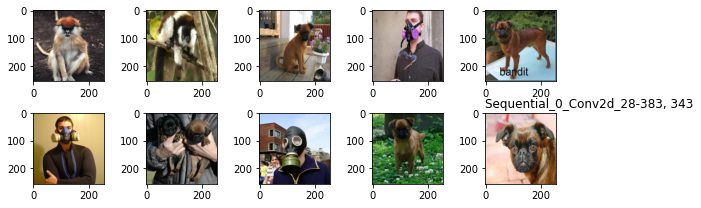

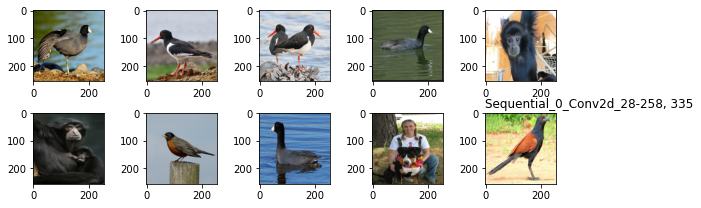

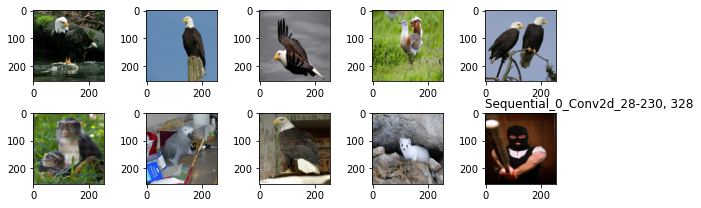

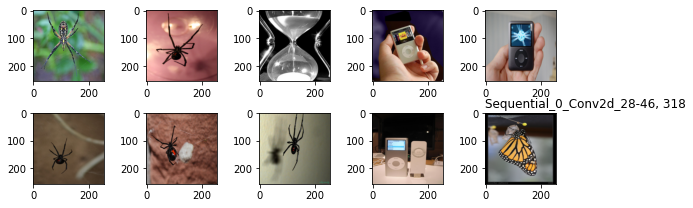

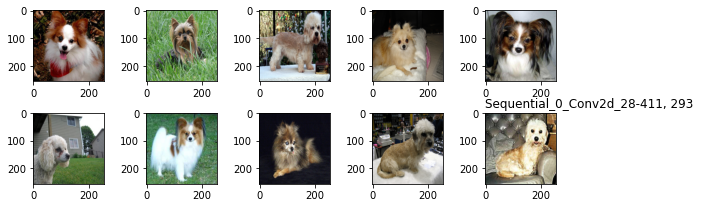

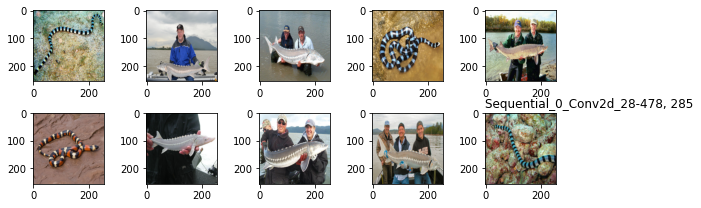

In [43]:
label = 384
layer = "Sequential_0_Conv2d_28"
model_nickname = 'vgg16-0.01-207'

print(f'Label={label}, {labels[label]}')

print_important_neurons(model_nickname, layer, label)
show_stimulus_of_important_neurons(model_nickname, layer, label)

# Pretrained ConvNeXt

## StochasticDepth_151

Label=230, Shetland_sheepdog
StochasticDepth_151-443, 1170
StochasticDepth_151-584, 1153
StochasticDepth_151-289, 1023
StochasticDepth_151-464, 965
StochasticDepth_151-614, 872
StochasticDepth_151-215, 672
StochasticDepth_151-456, 577
StochasticDepth_151-285, 557
StochasticDepth_151-299, 490
StochasticDepth_151-617, 427


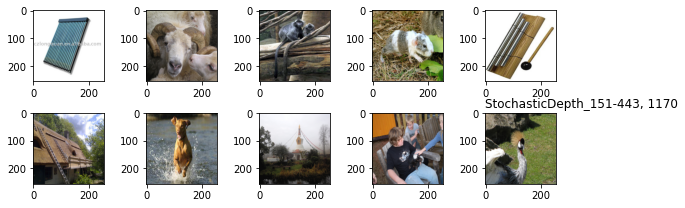

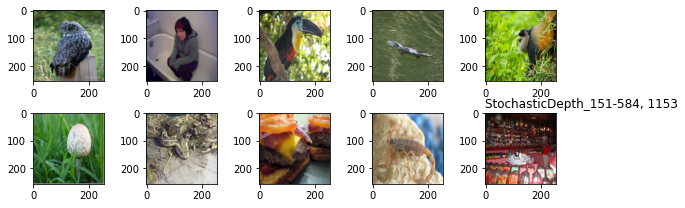

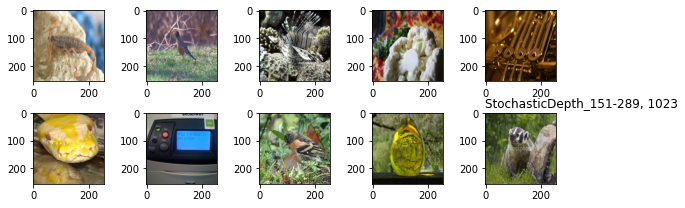

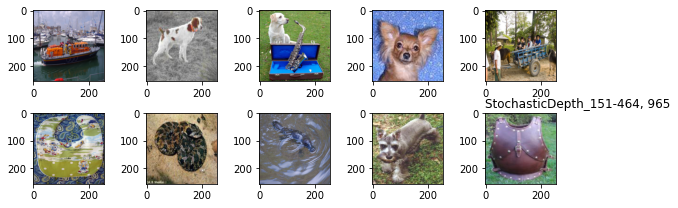

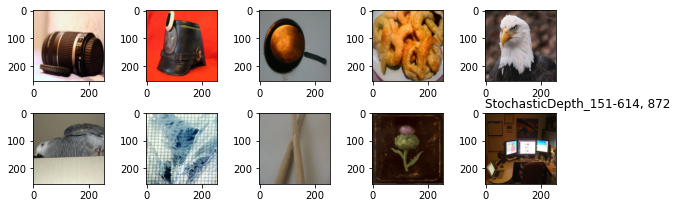

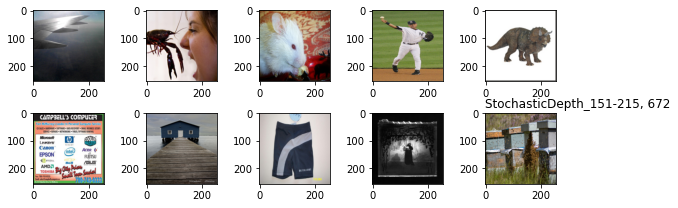

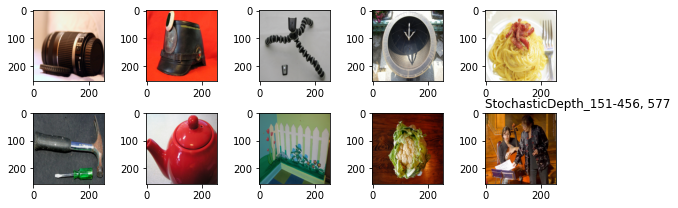

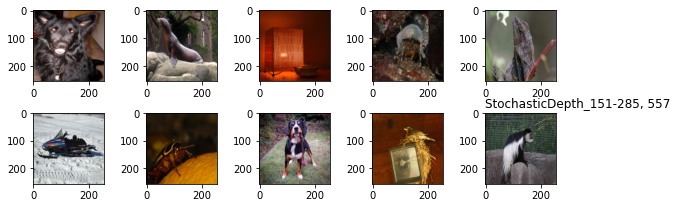

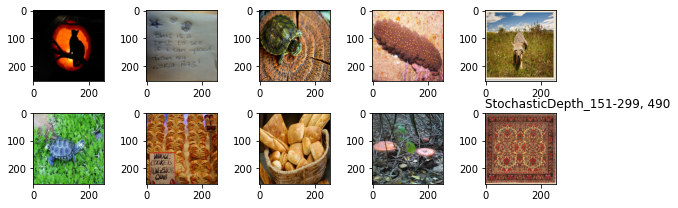

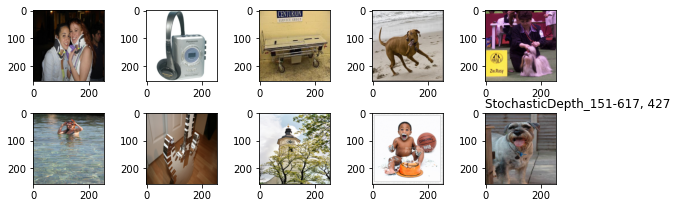

In [51]:
label = 230
layer = "StochasticDepth_151"
model_nickname = 'convnext_pretrained'

print(f'Label={label}, {labels[label]}')

print_important_neurons(model_nickname, layer, label)
show_stimulus_of_important_neurons(model_nickname, layer, label)

Label=384, Indri
StochasticDepth_151-443, 1196
StochasticDepth_151-584, 1177
StochasticDepth_151-289, 1045
StochasticDepth_151-614, 922
StochasticDepth_151-464, 840
StochasticDepth_151-456, 787
StochasticDepth_151-285, 671
StochasticDepth_151-485, 604
StochasticDepth_151-215, 584
StochasticDepth_151-611, 511


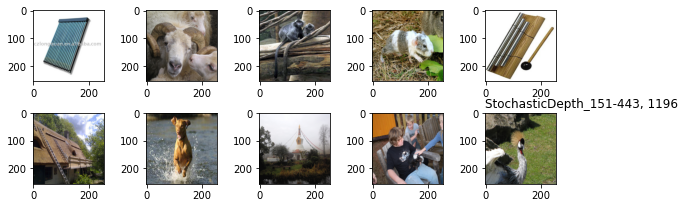

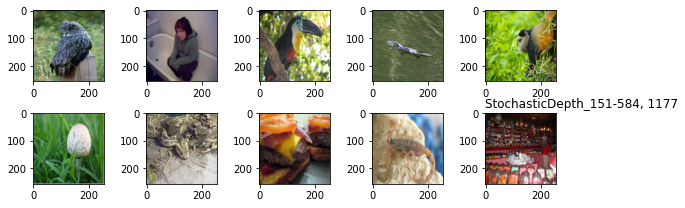

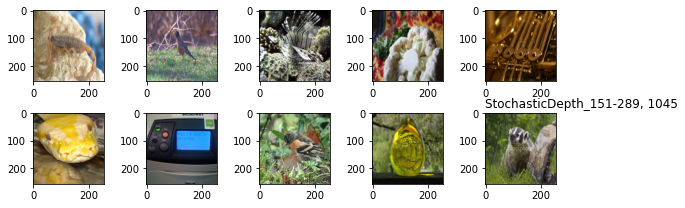

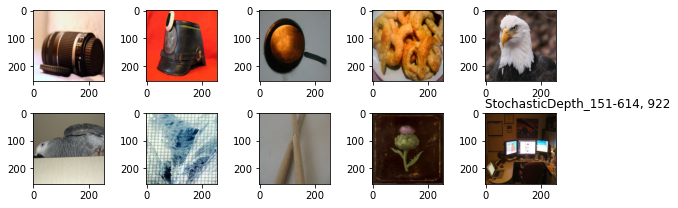

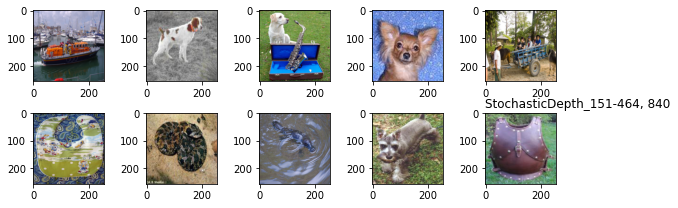

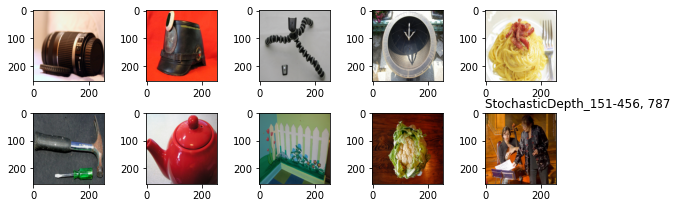

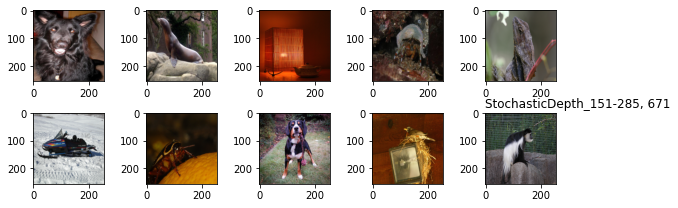

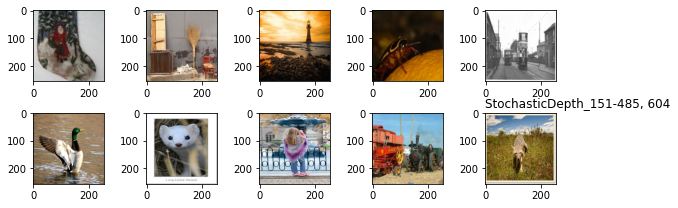

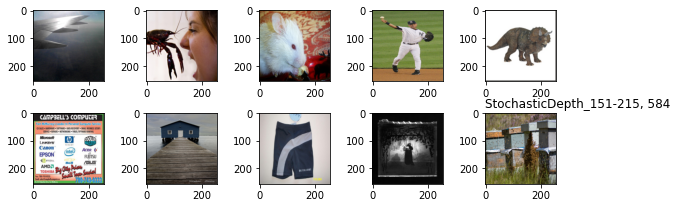

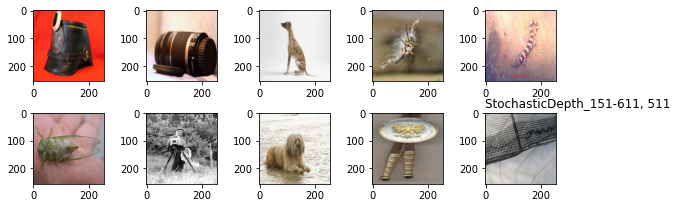

In [49]:
label = 384
layer = "StochasticDepth_151"
model_nickname = 'convnext_pretrained'

print(f'Label={label}, {labels[label]}')

print_important_neurons(model_nickname, layer, label)
show_stimulus_of_important_neurons(model_nickname, layer, label)

Label=457, bow_tie
StochasticDepth_151-443, 925
StochasticDepth_151-584, 902
StochasticDepth_151-289, 798
StochasticDepth_151-464, 694
StochasticDepth_151-614, 560
StochasticDepth_151-215, 504
StochasticDepth_151-456, 469
StochasticDepth_151-617, 418
StochasticDepth_151-299, 406
StochasticDepth_151-533, 393


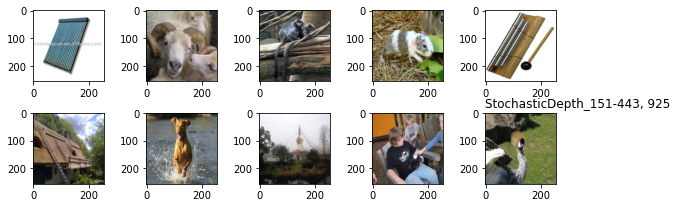

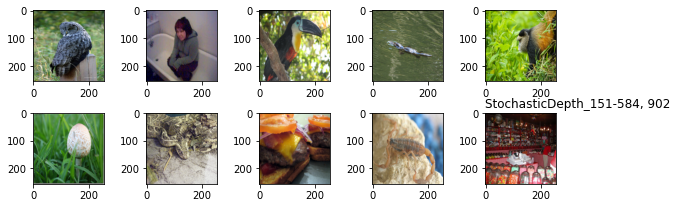

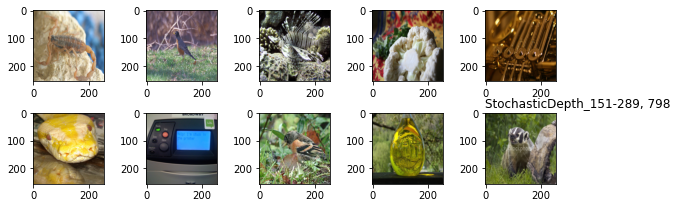

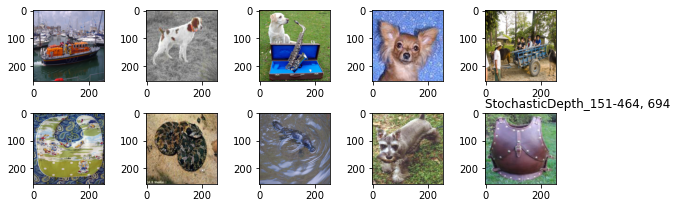

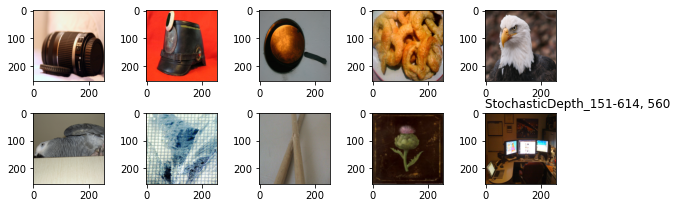

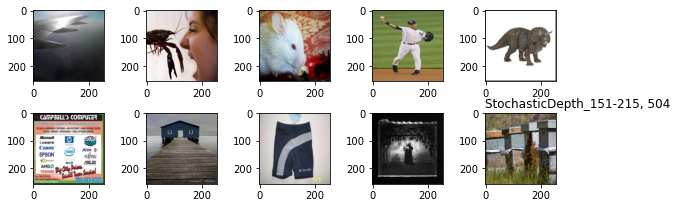

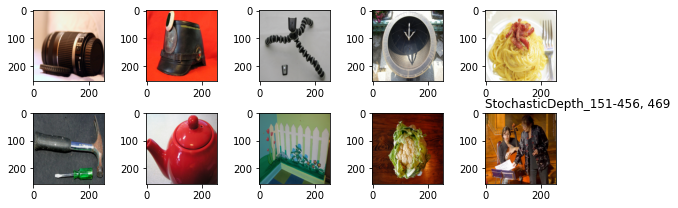

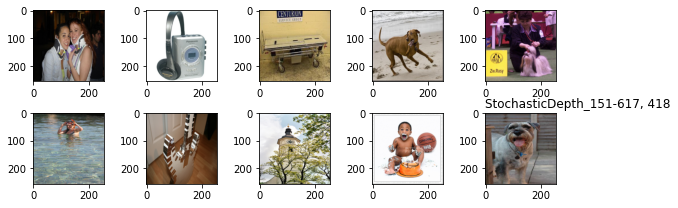

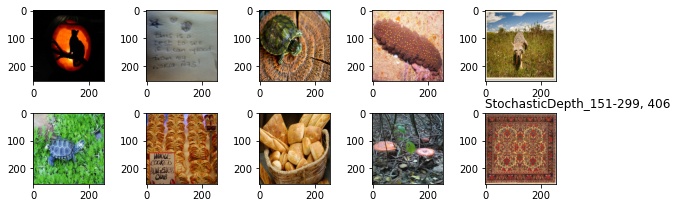

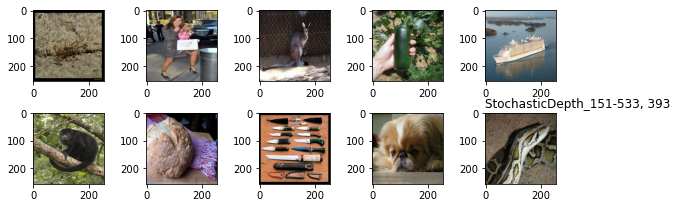

In [50]:
label = 457
layer = "StochasticDepth_151"
model_nickname = 'convnext_pretrained'

print(f'Label={label}, {labels[label]}')

print_important_neurons(model_nickname, layer, label)
show_stimulus_of_important_neurons(model_nickname, layer, label)

## Class 457 (Bow tie)

In [20]:
# Important neurons in Conv2d_18 for class 457
label = 457
layer = 'Conv2d_18'
model_nickname = 'convnext_pretrained'

p = gen_important_neuron_path(model_nickname, layer, label)
d = load_json(p)
sorted_d = sort_dict_by_nums_of_imgs(d)

for neuron in sorted_d.keys():
    num_imgs = len(d[neuron]['img_idxs'])
    print(f'{neuron}, {num_imgs}')

Conv2d_18-30, 1013
Conv2d_18-84, 1010
Conv2d_18-5, 1009
Conv2d_18-75, 1004
Conv2d_18-24, 973
Conv2d_18-56, 927
Conv2d_18-65, 899
Conv2d_18-38, 872
Conv2d_18-32, 727
Conv2d_18-60, 210


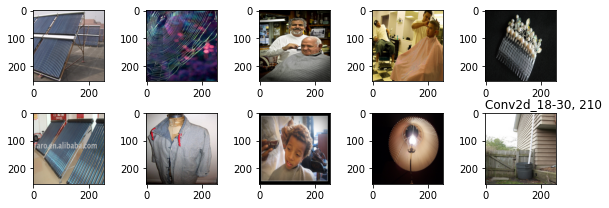

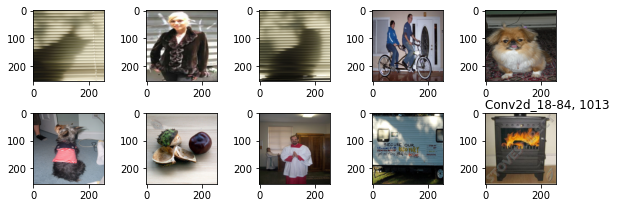

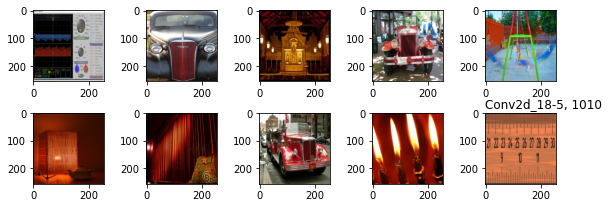

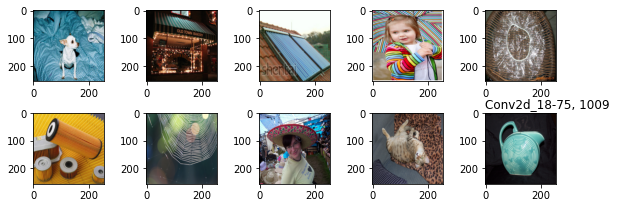

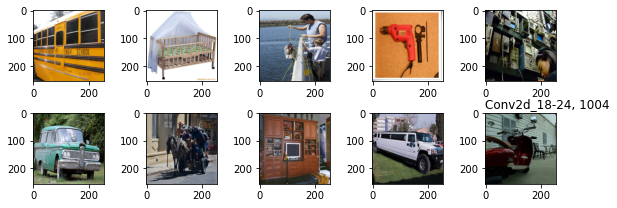

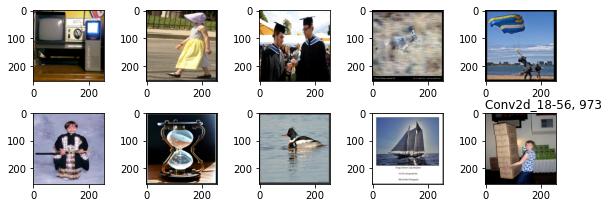

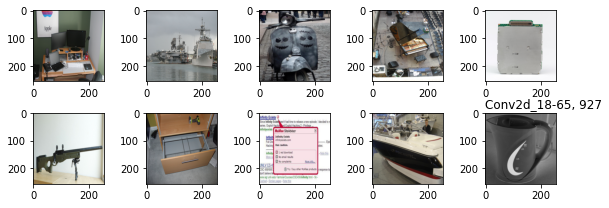

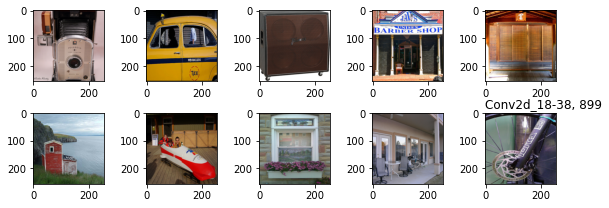

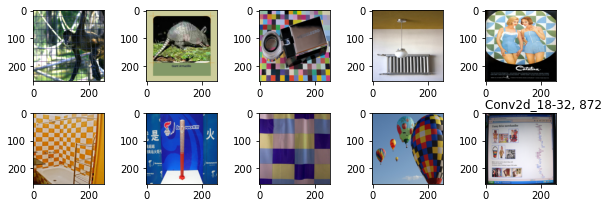

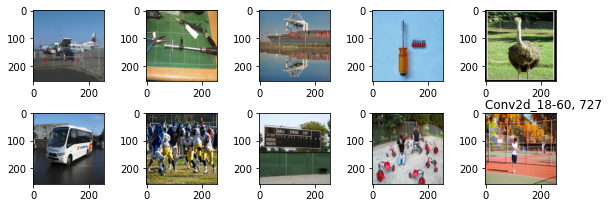

In [21]:
# Stimulus of the important neurons
p = gen_stimulus_path(model_nickname)
stimulus = load_json(p)

# Show the stimulus
nrows = 2
ncols = 5

for neuron in sorted_d.keys():
    neuron_i = int(neuron.split('-')[-1])
    stimulating_imgs = stimulus[layer][neuron_i]
    fig, ax = plt.subplots(
        nrows, ncols, 
        figsize=(nrows * 4, ncols * 0.6)
    )
    fig.tight_layout()
    plt.title(f'{neuron}, {num_imgs}', loc='left')
    for i, img_idx in enumerate(stimulating_imgs[:nrows * ncols]):
        img = raw_training_datasets[img_idx][0]
        img = np.einsum('kij->ijk', img)
        
        row = int(i / ncols)
        col = i - row * ncols
        ax[row, col].imshow(img)
        # plt.subplot(nrows, ncols, i + 1)
        
        # plt.imshow(img)
    num_imgs = len(d[neuron]['img_idxs'])
    plt.show()

## Class 230 (Shetland Sheepdog), Conv2d_144

In [23]:
# Important neurons
label = 230
layer = 'Conv2d_144'
model_nickname = 'convnext_pretrained'

p = gen_important_neuron_path(model_nickname, layer, label)
d = load_json(p)
sorted_d = sort_dict_by_nums_of_imgs(d)

for neuron in sorted_d.keys():
    num_imgs = len(d[neuron]['img_idxs'])
    print(f'{neuron}, {num_imgs}')

Conv2d_144-521, 1189
Conv2d_144-14, 1172
Conv2d_144-317, 1171
Conv2d_144-583, 1111
Conv2d_144-32, 1089
Conv2d_144-50, 1077
Conv2d_144-213, 1055
Conv2d_144-533, 1050
Conv2d_144-605, 908
Conv2d_144-758, 838


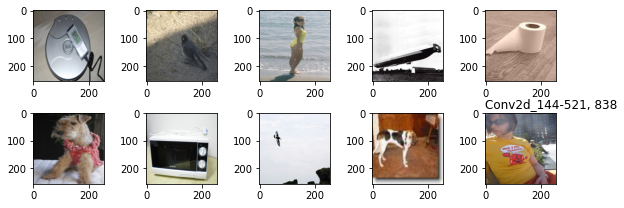

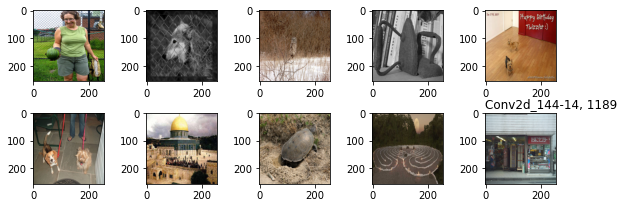

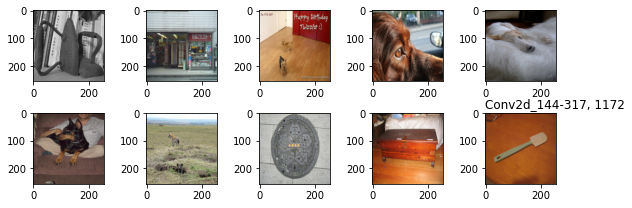

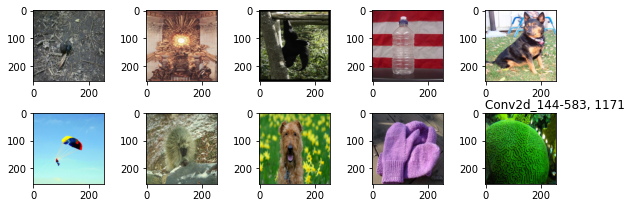

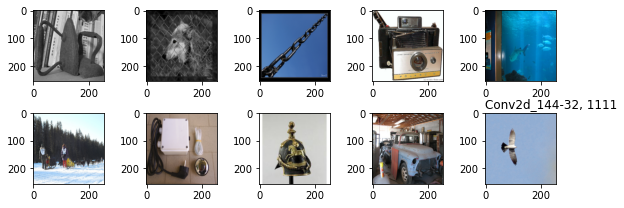

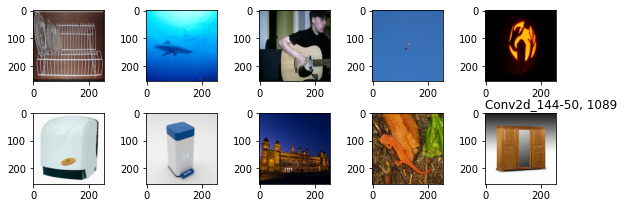

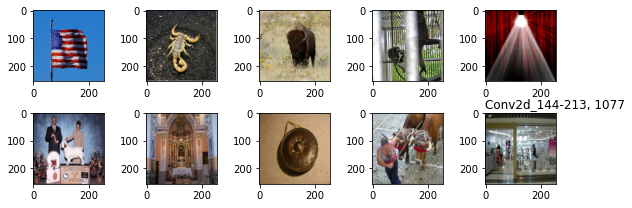

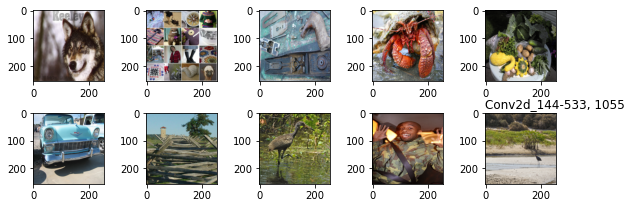

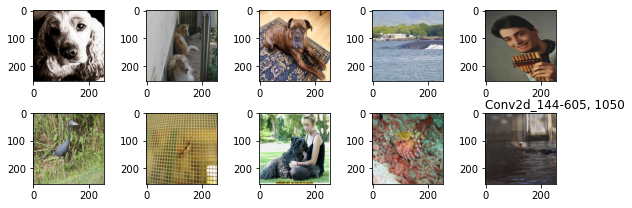

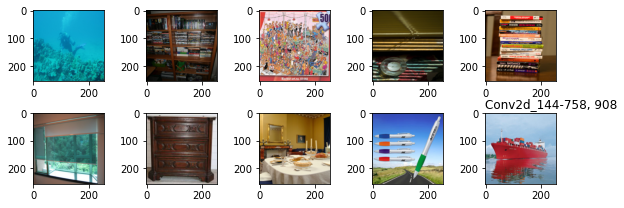

In [24]:
# Stimulus of the important neurons
p = gen_stimulus_path(model_nickname)
stimulus = load_json(p)

# Show the stimulus
nrows = 2
ncols = 5

for neuron in sorted_d.keys():
    neuron_i = int(neuron.split('-')[-1])
    stimulating_imgs = stimulus[layer][neuron_i]
    fig, ax = plt.subplots(
        nrows, ncols, 
        figsize=(nrows * 4, ncols * 0.6)
    )
    fig.tight_layout()
    plt.title(f'{neuron}, {num_imgs}', loc='left')
    for i, img_idx in enumerate(stimulating_imgs[:nrows * ncols]):
        img = raw_training_datasets[img_idx][0]
        img = np.einsum('kij->ijk', img)
        
        row = int(i / ncols)
        col = i - row * ncols
        ax[row, col].imshow(img)
        # plt.subplot(nrows, ncols, i + 1)
        
        # plt.imshow(img)
    num_imgs = len(d[neuron]['img_idxs'])
    plt.show()

## Class 457 (Bow tie), Conv2d_144

In [27]:
# Important neurons
label = 457
layer = 'Conv2d_144'
model_nickname = 'convnext_pretrained'

p = gen_important_neuron_path(model_nickname, layer, label)
d = load_json(p)
sorted_d = sort_dict_by_nums_of_imgs(d)

for neuron in sorted_d.keys():
    num_imgs = len(d[neuron]['img_idxs'])
    print(f'{neuron}, {num_imgs}')

Conv2d_144-521, 921
Conv2d_144-14, 912
Conv2d_144-317, 912
Conv2d_144-32, 869
Conv2d_144-583, 860
Conv2d_144-50, 817
Conv2d_144-213, 791
Conv2d_144-533, 773
Conv2d_144-605, 746
Conv2d_144-758, 726


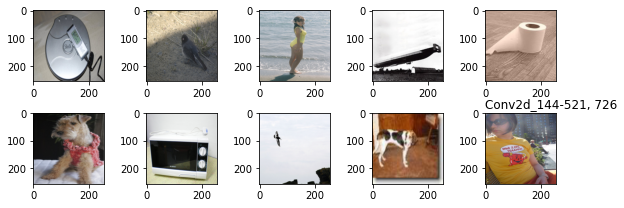

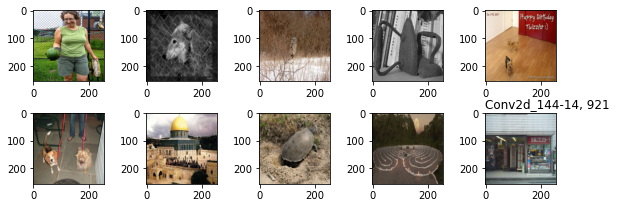

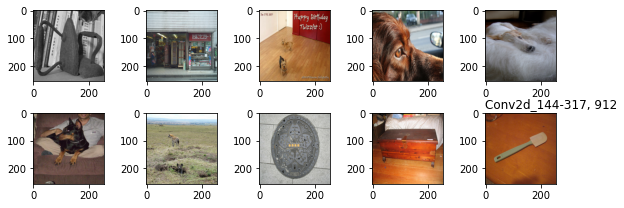

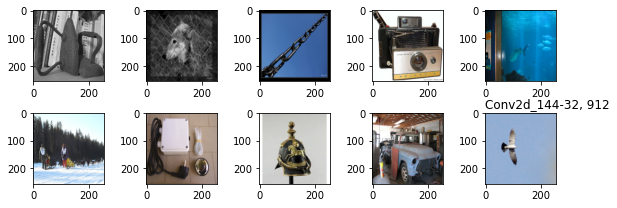

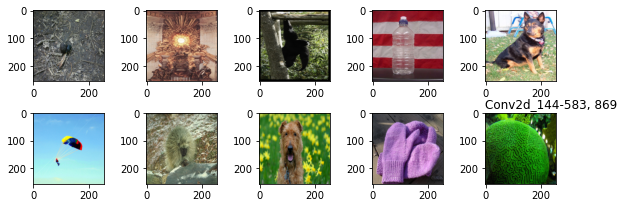

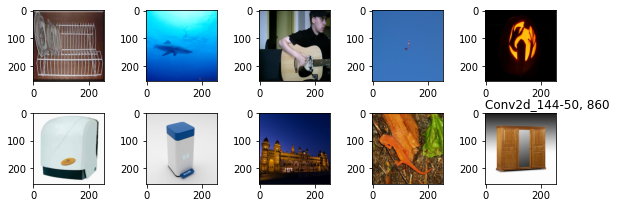

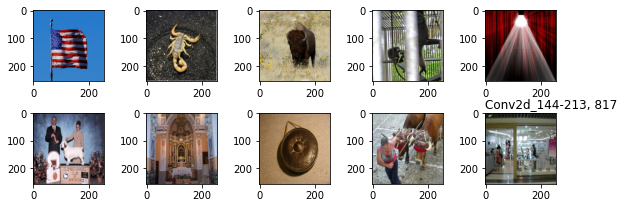

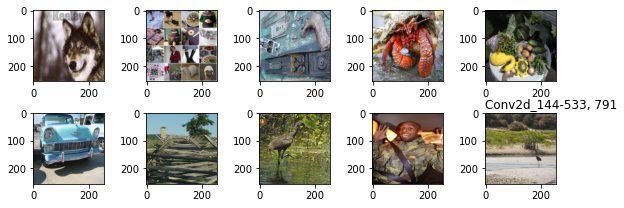

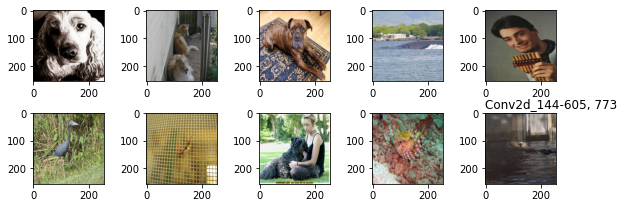

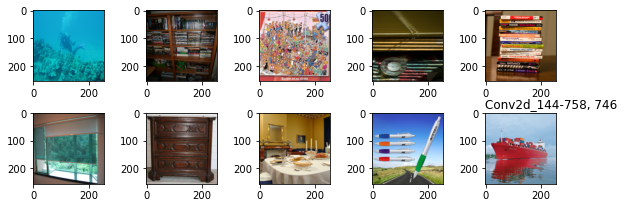

In [28]:
# Stimulus of the important neurons
p = gen_stimulus_path(model_nickname)
stimulus = load_json(p)

# Show the stimulus
nrows = 2
ncols = 5

for neuron in sorted_d.keys():
    neuron_i = int(neuron.split('-')[-1])
    stimulating_imgs = stimulus[layer][neuron_i]
    fig, ax = plt.subplots(
        nrows, ncols, 
        figsize=(nrows * 4, ncols * 0.6)
    )
    fig.tight_layout()
    plt.title(f'{neuron}, {num_imgs}', loc='left')
    for i, img_idx in enumerate(stimulating_imgs[:nrows * ncols]):
        img = raw_training_datasets[img_idx][0]
        img = np.einsum('kij->ijk', img)
        
        row = int(i / ncols)
        col = i - row * ncols
        ax[row, col].imshow(img)
        # plt.subplot(nrows, ncols, i + 1)
        
        # plt.imshow(img)
    num_imgs = len(d[neuron]['img_idxs'])
    plt.show()

## Class 230 (Shetland sheepdog), Conv2d_0

In [29]:
# Important neurons
label = 230
layer = 'Conv2d_0'
model_nickname = 'convnext_pretrained'

p = gen_important_neuron_path(model_nickname, layer, label)
d = load_json(p)
sorted_d = sort_dict_by_nums_of_imgs(d)

for neuron in sorted_d.keys():
    num_imgs = len(d[neuron]['img_idxs'])
    print(f'{neuron}, {num_imgs}')

Conv2d_0-69, 1231
Conv2d_0-16, 1227
Conv2d_0-52, 1014
Conv2d_0-67, 976
Conv2d_0-26, 830
Conv2d_0-48, 807
Conv2d_0-68, 678
Conv2d_0-89, 539
Conv2d_0-8, 446
Conv2d_0-32, 444


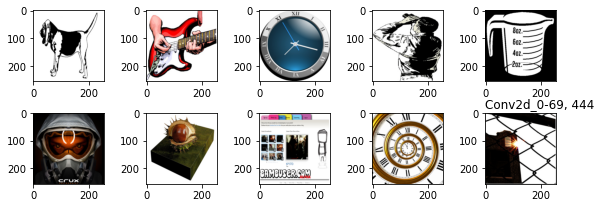

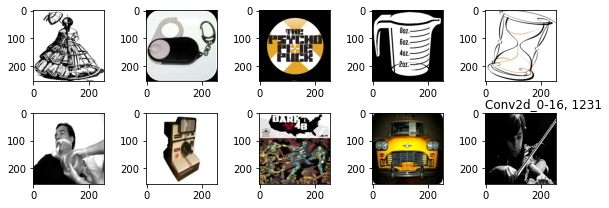

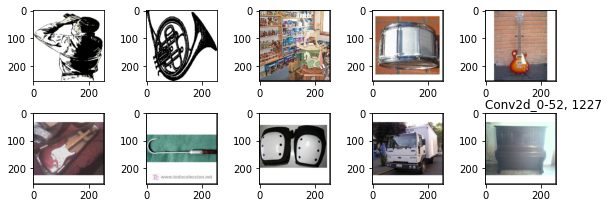

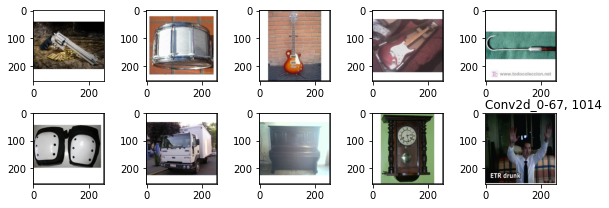

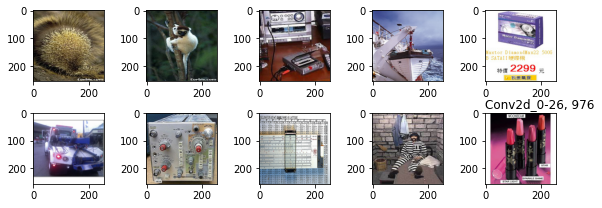

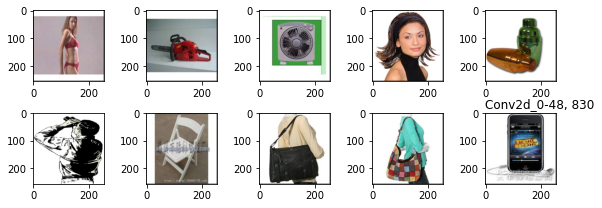

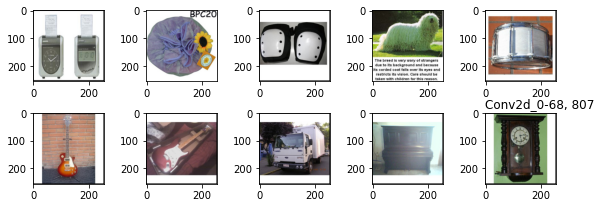

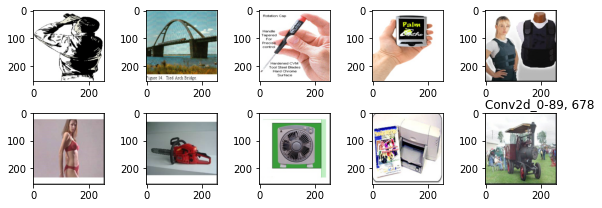

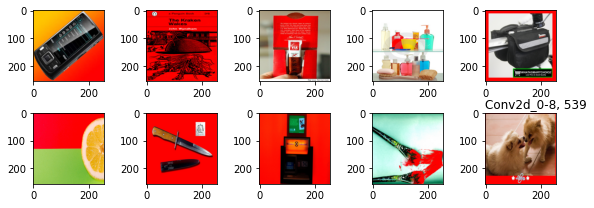

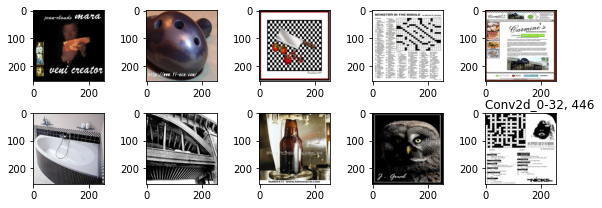

In [30]:
# Stimulus of the important neurons
p = gen_stimulus_path(model_nickname)
stimulus = load_json(p)

# Show the stimulus
nrows = 2
ncols = 5

for neuron in sorted_d.keys():
    neuron_i = int(neuron.split('-')[-1])
    stimulating_imgs = stimulus[layer][neuron_i]
    fig, ax = plt.subplots(
        nrows, ncols, 
        figsize=(nrows * 4, ncols * 0.6)
    )
    fig.tight_layout()
    plt.title(f'{neuron}, {num_imgs}', loc='left')
    for i, img_idx in enumerate(stimulating_imgs[:nrows * ncols]):
        img = raw_training_datasets[img_idx][0]
        img = np.einsum('kij->ijk', img)
        
        row = int(i / ncols)
        col = i - row * ncols
        ax[row, col].imshow(img)
        # plt.subplot(nrows, ncols, i + 1)
        
        # plt.imshow(img)
    num_imgs = len(d[neuron]['img_idxs'])
    plt.show()

## ResNet18 pretrained

In [54]:
label = 230
layer = "Sequential_7_BasicBlock_0_Conv2d_3"
model_nickname = 'resnet18_pretrained'

print(f'Label={label}, {labels[label]}')

print_important_neurons(model_nickname, layer, label)
# show_stimulus_of_important_neurons(model_nickname, layer, label)

Label=230, Shetland_sheepdog
Sequential_7_BasicBlock_0_Conv2d_3-237, 1175
Sequential_7_BasicBlock_0_Conv2d_3-233, 1165
Sequential_7_BasicBlock_0_Conv2d_3-372, 224
Sequential_7_BasicBlock_0_Conv2d_3-284, 215
Sequential_7_BasicBlock_0_Conv2d_3-216, 138
Sequential_7_BasicBlock_0_Conv2d_3-157, 132
Sequential_7_BasicBlock_0_Conv2d_3-113, 123
Sequential_7_BasicBlock_0_Conv2d_3-289, 117
Sequential_7_BasicBlock_0_Conv2d_3-38, 114
Sequential_7_BasicBlock_0_Conv2d_3-261, 107


In [56]:
label = 384
layer = "Sequential_7_BasicBlock_0_Conv2d_3"
model_nickname = 'resnet18_pretrained'

print(f'Label={label}, {labels[label]}')

print_important_neurons(model_nickname, layer, label)
# show_stimulus_of_important_neurons(model_nickname, layer, label)

Label=384, Indri
Sequential_7_BasicBlock_0_Conv2d_3-237, 1177
Sequential_7_BasicBlock_0_Conv2d_3-233, 1170
Sequential_7_BasicBlock_0_Conv2d_3-372, 292
Sequential_7_BasicBlock_0_Conv2d_3-284, 210
Sequential_7_BasicBlock_0_Conv2d_3-216, 129
Sequential_7_BasicBlock_0_Conv2d_3-113, 113
Sequential_7_BasicBlock_0_Conv2d_3-29, 112
Sequential_7_BasicBlock_0_Conv2d_3-261, 112
Sequential_7_BasicBlock_0_Conv2d_3-157, 111
Sequential_7_BasicBlock_0_Conv2d_3-180, 108


In [57]:
label = 400
layer = "Sequential_7_BasicBlock_0_Conv2d_3"
model_nickname = 'resnet18_pretrained'

print(f'Label={label}, {labels[label]}')

print_important_neurons(model_nickname, layer, label)
# show_stimulus_of_important_neurons(model_nickname, layer, label)

Label=400, academic_gown
Sequential_7_BasicBlock_0_Conv2d_3-233, 1196
Sequential_7_BasicBlock_0_Conv2d_3-237, 1191
Sequential_7_BasicBlock_0_Conv2d_3-284, 253
Sequential_7_BasicBlock_0_Conv2d_3-372, 243
Sequential_7_BasicBlock_0_Conv2d_3-157, 136
Sequential_7_BasicBlock_0_Conv2d_3-216, 135
Sequential_7_BasicBlock_0_Conv2d_3-448, 114
Sequential_7_BasicBlock_0_Conv2d_3-419, 106
Sequential_7_BasicBlock_0_Conv2d_3-113, 104
Sequential_7_BasicBlock_0_Conv2d_3-253, 103
